In [163]:
from PIL import Image
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from tqdm import tqdm
import os
import json

In [164]:
import matplotlib as mlp
import matplotlib.font_manager as fm
font_name = fm.FontProperties(fname = "C:/Windows/Fonts/malgun.ttf").get_name()
plt.rc("font", family = font_name)
mlp.rcParams["axes.unicode_minus"] = False

In [165]:
# 경로 
bb_dir = "C:/juna27/PythonWork/AI/data/tomato_label/시설작물진단/[라벨]11.토마토_1.질병"

# load
bb_json_data = []
for file_name in tqdm(os.listdir(bb_dir)):
    if file_name.endswith(".json"):
        file_path = os.path.join(bb_dir, file_name)
        with open(file_path, "r", encoding="utf-8") as target_file:
            bb_json_data.append(json.load(target_file))

100%|████████████████████████████████████████████████████████████████████████████| 1967/1967 [00:00<00:00, 7243.94it/s]


In [166]:
label_names = os.listdir("C:/juna27/PythonWork/AI/data/tomato_label/시설작물진단/[라벨]11.토마토_1.질병")

In [167]:
# 이미지
image_names = os.listdir("C:/juna27/PythonWork/AI/data/tomato_label/시설작물진단/11.토마토_1.질병")

In [168]:
# json_data

100%|████████████████████████████████████████████████████████████████████████████| 1967/1967 [00:00<00:00, 6724.29it/s]


json 구성 확인 {'description': {'image': 'V006_77_1_18_11_03_13_1_3248b_20201005_57.jpg', 'date': '2020/10/05', 'worker': '', 'height': 3024, 'width': 4032, 'task': 77, 'type': 1, 'region': 4}, 'annotations': {'disease': 18, 'crop': 11, 'area': 3, 'grow': 13, 'risk': 1, 'points': [{'xtl': 908, 'ytl': 916, 'xbr': 3104, 'ybr': 2312}]}}
BB 좌표 샘플
[[908, 916, 3104, 2312]]


  0%|                                                                                           | 0/12 [00:00<?, ?it/s]

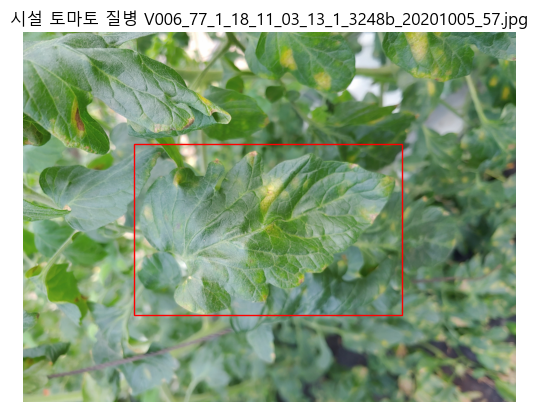

  8%|██████▉                                                                            | 1/12 [00:01<00:18,  1.70s/it]

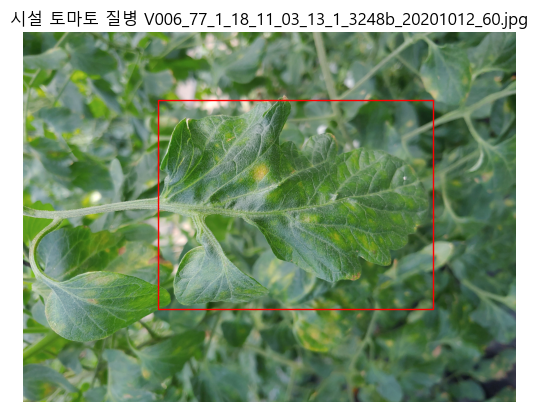

 17%|█████████████▊                                                                     | 2/12 [00:03<00:16,  1.70s/it]

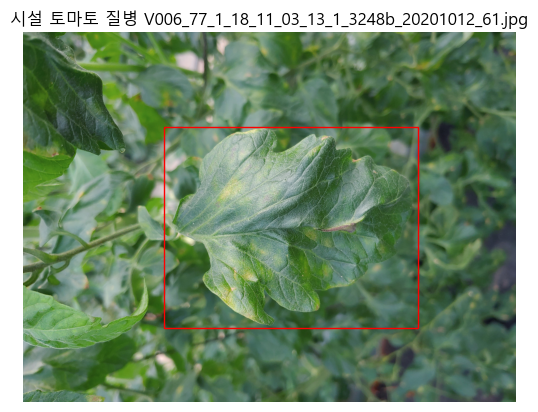

 25%|████████████████████▊                                                              | 3/12 [00:05<00:15,  1.70s/it]

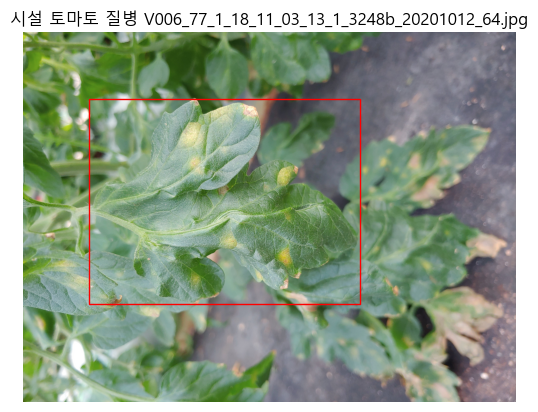

 33%|███████████████████████████▋                                                       | 4/12 [00:06<00:13,  1.70s/it]

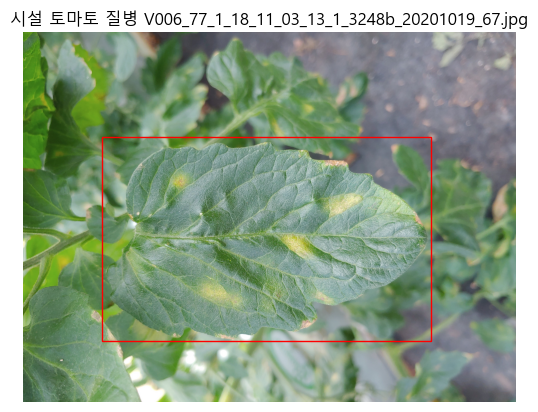

 42%|██████████████████████████████████▌                                                | 5/12 [00:08<00:11,  1.70s/it]

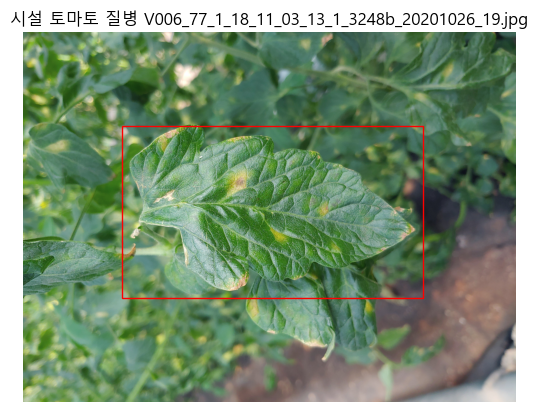

 50%|█████████████████████████████████████████▌                                         | 6/12 [00:10<00:10,  1.69s/it]

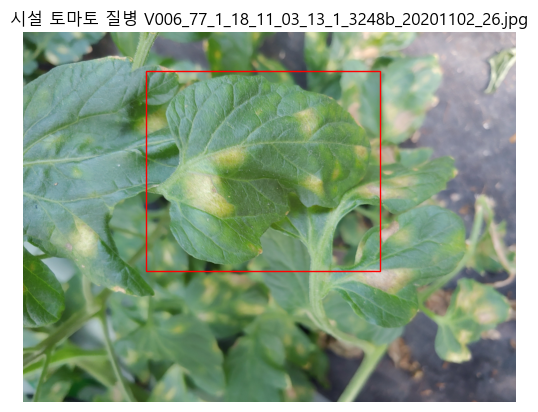

 58%|████████████████████████████████████████████████▍                                  | 7/12 [00:11<00:08,  1.70s/it]

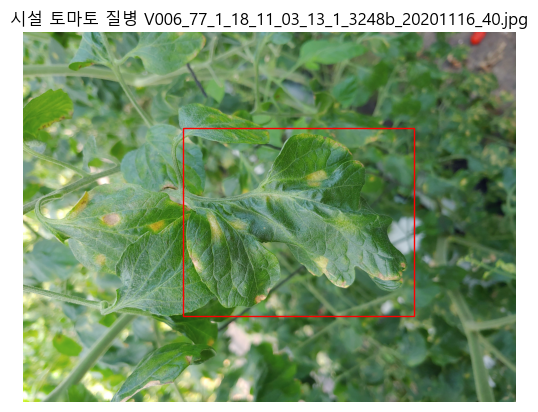

 67%|███████████████████████████████████████████████████████▎                           | 8/12 [00:13<00:06,  1.69s/it]

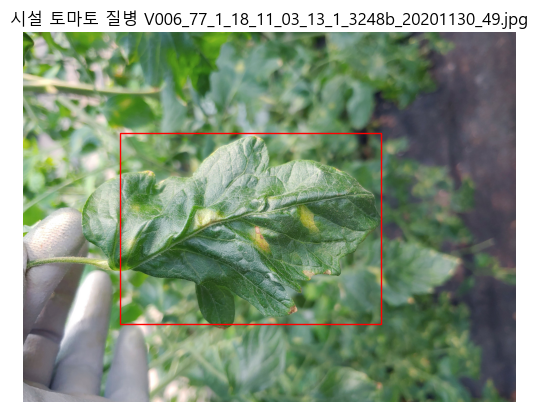

 75%|██████████████████████████████████████████████████████████████▎                    | 9/12 [00:15<00:05,  1.69s/it]

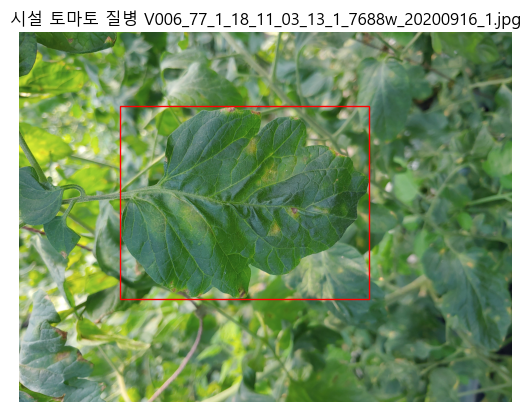

 83%|████████████████████████████████████████████████████████████████████▎             | 10/12 [00:16<00:03,  1.70s/it]

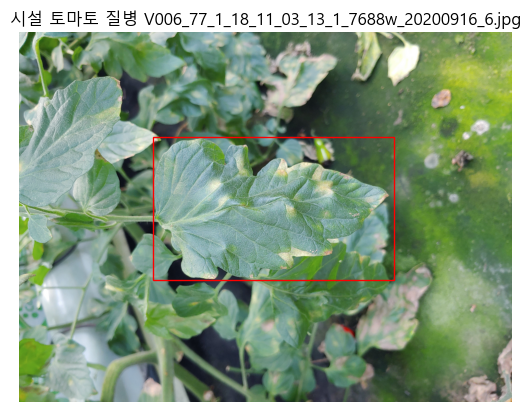

 92%|███████████████████████████████████████████████████████████████████████████▏      | 11/12 [00:18<00:01,  1.70s/it]

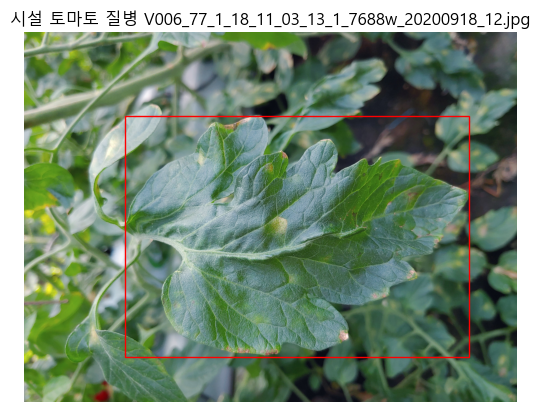

100%|██████████████████████████████████████████████████████████████████████████████████| 12/12 [00:20<00:00,  1.70s/it]


In [172]:
# 경로 
bb_dir = "C:/juna27/PythonWork/AI/data/tomato_label/시설작물진단/[라벨]11.토마토_1.질병"
img_dir = "C:/juna27/PythonWork/AI/data/tomato_label/시설작물진단/11.토마토_1.질병"
# load
bb_json_data = []
for file_name in tqdm(os.listdir(bb_dir)):
    if file_name.endswith(".json"):
        file_path = os.path.join(bb_dir, file_name)
        with open(file_path, "r", encoding="utf-8") as target_file:
            bb_json_data.append(json.load(target_file))
            
##################################################
# json 데이터 copy
bb_json_data
json_data = bb_json_data.copy()
print("json 구성 확인", json_data[0])

label_names = os.listdir(bb_dir)
image_names = os.listdir(img_dir)

# BoundingBox 좌표 확인
print("BB 좌표 샘플")
print([list(json_data[0]["annotations"]["points"][0].values())])

##################################################
image_names = os.listdir(img_dir)

# for i in tqdm(range(len(image_names))):
for i in tqdm(range(12)):
    image_path = os.path.join(img_dir, image_names[i])
    image = Image.open(image_path)

    box_coordinates = [list(json_data[i]["annotations"]["points"][0].values())]
    fig, ax = plt.subplots(1)
    ax.imshow(image)

    for box in box_coordinates:
        xtl, ytl, xbr, ybr = box
        x = xtl
        y = ytl
        width = xbr - xtl
        height = ybr - ytl
        rect = patches.Rectangle((x, y), width, height, linewidth=1, edgecolor="r", facecolor="none")
        ax.add_patch(rect)

    save_path = os.path.join("C:/juna27/PythonWork/AI/data/tomato_label/시설작물진단/image_bb/질병", image_names[i])
    plt.savefig(save_path)
    plt.title("시설 토마토 질병 " + image_names[i])
    plt.axis("off")
    plt.show()

# 테ㅔ스트

100%|████████████████████████████████████████████████████████████████████████████| 1967/1967 [00:00<00:00, 6724.29it/s]


json 구성 확인 {'description': {'image': 'V006_77_1_18_11_03_13_1_3248b_20201005_57.jpg', 'date': '2020/10/05', 'worker': '', 'height': 3024, 'width': 4032, 'task': 77, 'type': 1, 'region': 4}, 'annotations': {'disease': 18, 'crop': 11, 'area': 3, 'grow': 13, 'risk': 1, 'points': [{'xtl': 908, 'ytl': 916, 'xbr': 3104, 'ybr': 2312}]}}
BB 좌표 샘플
[[908, 916, 3104, 2312]]


  0%|                                                                                           | 0/12 [00:00<?, ?it/s]

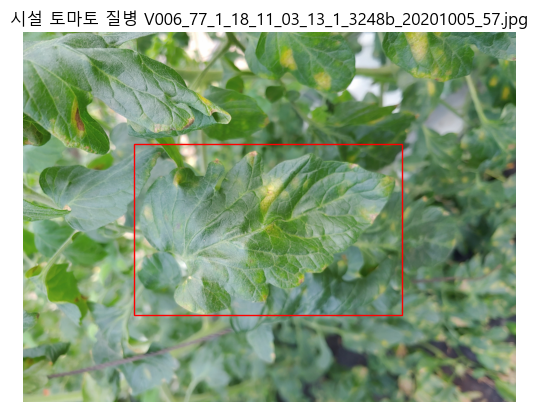

  8%|██████▉                                                                            | 1/12 [00:01<00:18,  1.70s/it]

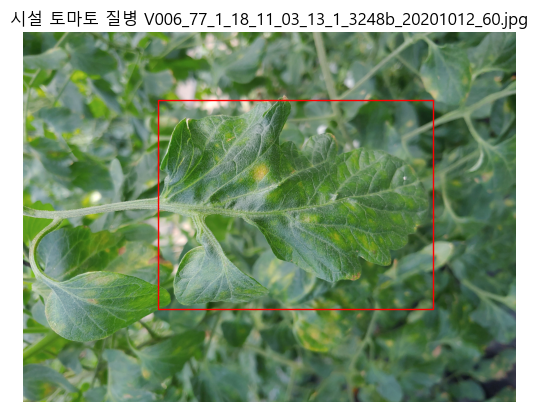

 17%|█████████████▊                                                                     | 2/12 [00:03<00:16,  1.70s/it]

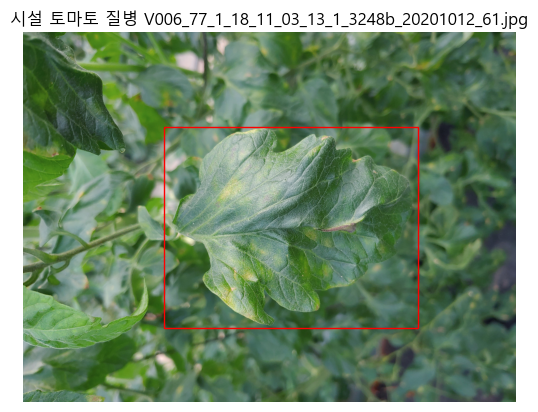

 25%|████████████████████▊                                                              | 3/12 [00:05<00:15,  1.70s/it]

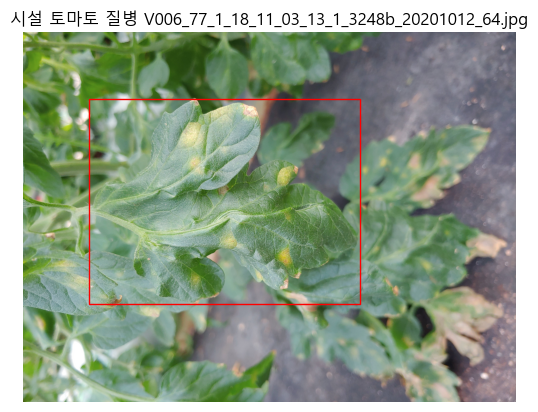

 33%|███████████████████████████▋                                                       | 4/12 [00:06<00:13,  1.70s/it]

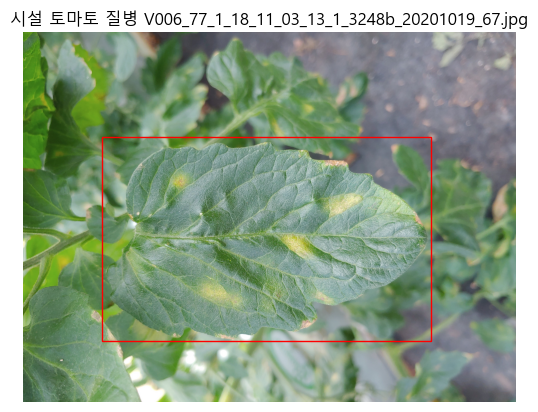

 42%|██████████████████████████████████▌                                                | 5/12 [00:08<00:11,  1.70s/it]

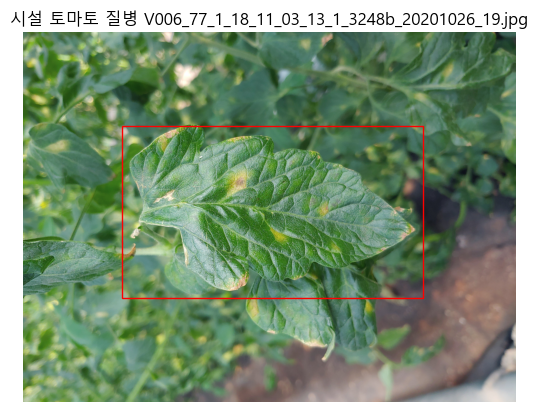

 50%|█████████████████████████████████████████▌                                         | 6/12 [00:10<00:10,  1.69s/it]

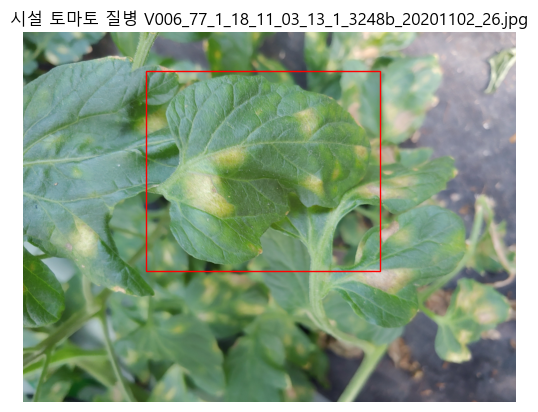

 58%|████████████████████████████████████████████████▍                                  | 7/12 [00:11<00:08,  1.70s/it]

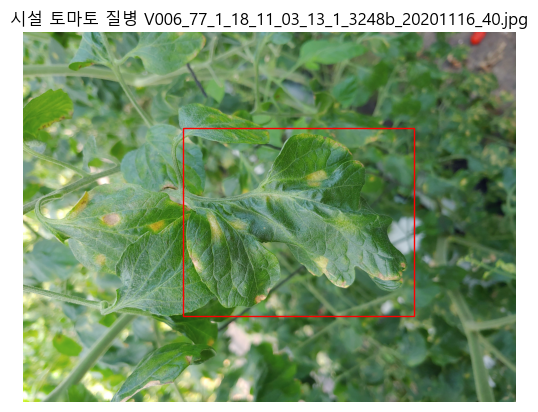

 67%|███████████████████████████████████████████████████████▎                           | 8/12 [00:13<00:06,  1.69s/it]

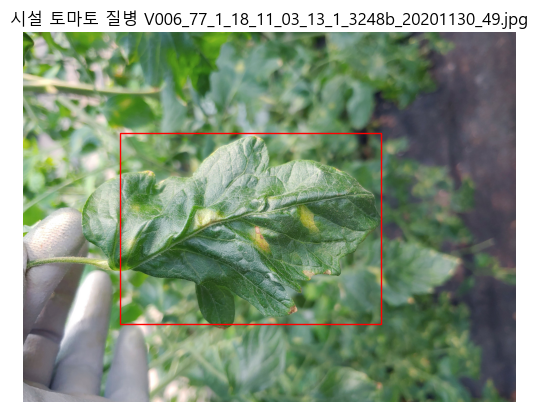

 75%|██████████████████████████████████████████████████████████████▎                    | 9/12 [00:15<00:05,  1.69s/it]

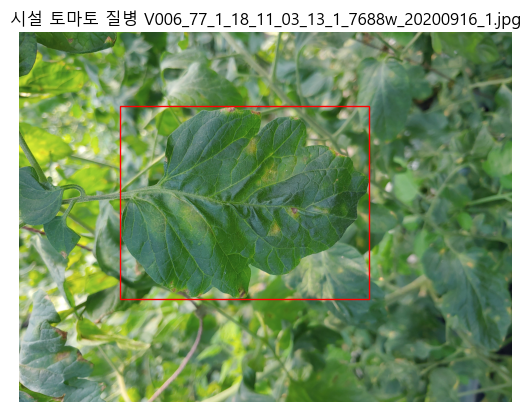

 83%|████████████████████████████████████████████████████████████████████▎             | 10/12 [00:16<00:03,  1.70s/it]

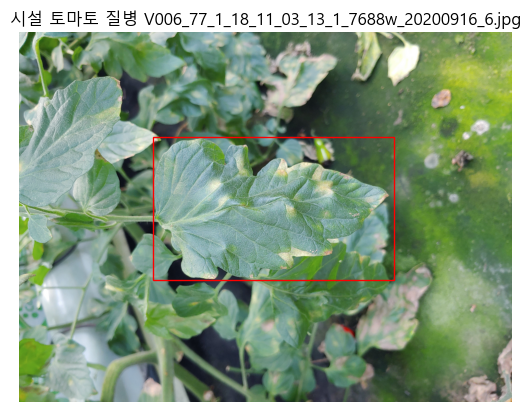

 92%|███████████████████████████████████████████████████████████████████████████▏      | 11/12 [00:18<00:01,  1.70s/it]

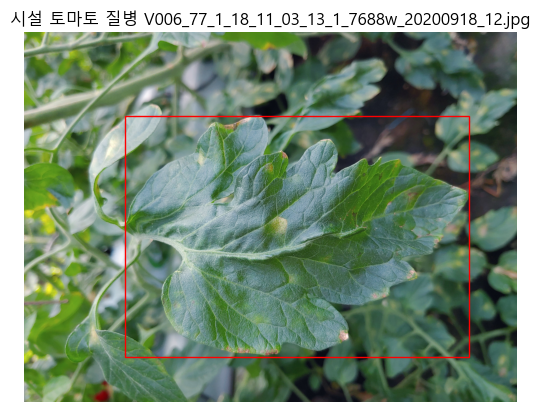

100%|██████████████████████████████████████████████████████████████████████████████████| 12/12 [00:20<00:00,  1.70s/it]


In [172]:
# 경로 
bb_dir = "C:/juna27/PythonWork/AI/data/tomato_label/시설작물진단/[라벨]11.토마토_1.질병"
img_dir = "C:/juna27/PythonWork/AI/data/tomato_label/시설작물진단/11.토마토_1.질병"

bb_dir = "C:/juna27/PythonWork/AI/data/tomato_label/시설작물진단/[라벨]11.토마토_1.질병"
img_dir = "C:/juna27/PythonWork/AI/data/tomato_label/시설작물진단/11.토마토_1.질병"

# load
bb_json_data = []
for file_name in tqdm(os.listdir(bb_dir)):
    if file_name.endswith(".json"):
        file_path = os.path.join(bb_dir, file_name)
        with open(file_path, "r", encoding="utf-8") as target_file:
            bb_json_data.append(json.load(target_file))
            
##################################################
# json 데이터 copy
bb_json_data
json_data = bb_json_data.copy()
print("json 구성 확인", json_data[0])

label_names = os.listdir(bb_dir)
image_names = os.listdir(img_dir)

# BoundingBox 좌표 확인
print("BB 좌표 샘플")
print([list(json_data[0]["annotations"]["points"][0].values())])

##################################################
image_names = os.listdir(img_dir)

# for i in tqdm(range(len(image_names))):
for i in tqdm(range(12)):
    image_path = os.path.join(img_dir, image_names[i])
    image = Image.open(image_path)

    box_coordinates = [list(json_data[i]["annotations"]["points"][0].values())]
    fig, ax = plt.subplots(1)
    ax.imshow(image)

    for box in box_coordinates:
        xtl, ytl, xbr, ybr = box
        x = xtl
        y = ytl
        width = xbr - xtl
        height = ybr - ytl
        rect = patches.Rectangle((x, y), width, height, linewidth=1, edgecolor="r", facecolor="none")
        ax.add_patch(rect)

    save_path = os.path.join("C:/juna27/PythonWork/AI/data/tomato_label/시설작물진단/image_bb/질병", image_names[i])
    plt.savefig(save_path)
    plt.title("시설 토마토 질병 " + image_names[i])
    plt.axis("off")
    plt.show()